IMPORT LIBRARY

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os
import pandas as pd
import seaborn as sns
from PIL import Image
from tensorflow.keras.datasets import mnist
import cv2
import imghdr
import hashlib
import shutil
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import Callback


C:\Users\Windows\AppData\Local\Temp\ipykernel_35440\3809518906.py:12: DeprecationWarning: 'imghdr' is deprecated and slated for removal in Python 3.13
  import imghdr


In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten,Input
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.models import Model, load_model, Sequential
from keras.callbacks import ModelCheckpoint
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from sklearn.metrics import confusion_matrix, classification_report
from IPython.display import display, HTML
import keras_tuner as kt
import shutil
from keras.callbacks import EarlyStopping
from tensorflow.keras.applications import MobileNetV2
import os

LOAD DATA

In [4]:
dataset_path = r"E:\RIDHO'S_LIFE\Dodoo\KULIAH\Semester 4\Deep Learning\AOL\batik"
def load_dataset(directory):
    images = []
    labels = []
    for folder_name in os.listdir(directory):
        folder_path = os.path.join(directory, folder_name)
        if os.path.isdir(folder_path):
            for filename in os.listdir(folder_path):
                img_path = os.path.join(folder_path, filename)
                try:
                    img = cv2.imread(img_path, cv2.IMREAD_COLOR)  # Memuat gambar dalam mode warna
                    if img is not None:
                        img = cv2.resize(img, (128, 128))  # Mengubah ukuran gambar ke 128x128 (misalnya)
                        images.append(img)
                        labels.append(folder_name)
                    else:
                        print(f"Error loading image {img_path}: Not a valid image file")
                except Exception as e:
                    print(f"Error loading image {img_path}: {e}")
    return np.array(images), np.array(labels)

x_full, y_full = load_dataset(dataset_path)

Error loading image E:\RIDHO'S_LIFE\Dodoo\KULIAH\Semester 4\Deep Learning\AOL\batik\batik-betawi\4.jpg: Not a valid image file
Error loading image E:\RIDHO'S_LIFE\Dodoo\KULIAH\Semester 4\Deep Learning\AOL\batik\batik-celup\19.jpg: Not a valid image file
Error loading image E:\RIDHO'S_LIFE\Dodoo\KULIAH\Semester 4\Deep Learning\AOL\batik\batik-cendrawasih\18.jpg: Not a valid image file
Error loading image E:\RIDHO'S_LIFE\Dodoo\KULIAH\Semester 4\Deep Learning\AOL\batik\batik-gentongan\8.jpg: Not a valid image file
Error loading image E:\RIDHO'S_LIFE\Dodoo\KULIAH\Semester 4\Deep Learning\AOL\batik\batik-megamendung\49.jpg: Not a valid image file
Error loading image E:\RIDHO'S_LIFE\Dodoo\KULIAH\Semester 4\Deep Learning\AOL\batik\batik-parang\47.jpg: Not a valid image file


> terlihat bahwa ada file data yang tidak valid

EXPLORE DATA

Melihat bentuk data

In [5]:
print("Bentuk x_full:", x_full.shape)
print("Bentuk y_full:", y_full.shape)

Bentuk x_full: (977, 128, 128, 3)
Bentuk y_full: (977,)


Menampilkan beberapa contoh gambar

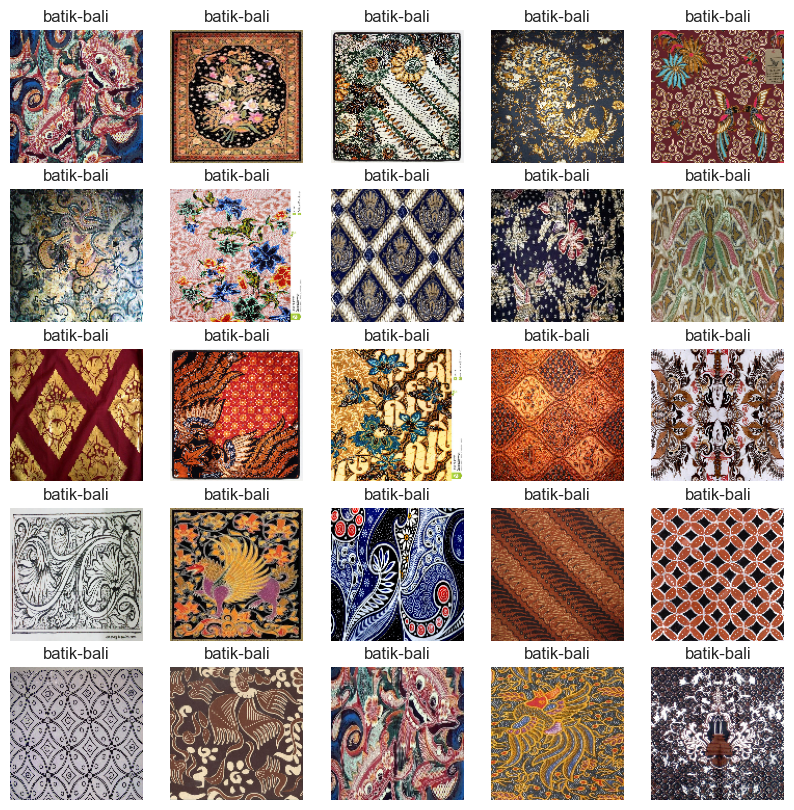

In [6]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(cv2.cvtColor(x_full[i], cv2.COLOR_BGR2RGB))  # Menampilkan dalam warna aslinya (BGR -> RGB)
    plt.title(y_full[i])
    plt.axis('off')
plt.show()

Melihat Class Data dan Jumlah di masing-masing Class

In [7]:
class_counts = pd.Series(y_full).value_counts()

print("Class Distribution:")
for class_name, count in class_counts.items():
    print(f"Class '{class_name}': {count} images")

Class Distribution:
Class 'batik-bali': 50 images
Class 'batik-keraton': 50 images
Class 'batik-sogan': 50 images
Class 'batik-sidoluhur': 50 images
Class 'batik-priangan': 50 images
Class 'batik-pekalongan': 50 images
Class 'batik-lasem': 50 images
Class 'batik-garutan': 50 images
Class 'batik-ciamis': 50 images
Class 'batik-tambal': 50 images
Class 'batik-gentongan': 49 images
Class 'batik-betawi': 49 images
Class 'batik-parang': 49 images
Class 'batik-cendrawasih': 49 images
Class 'batik-celup': 49 images
Class 'batik-ceplok': 48 images
Class 'batik-sekar': 47 images
Class 'batik-megamendung': 46 images
Class 'batik-sidomukti': 46 images
Class 'batik-kawung': 45 images


Visualisasi Distribusi Data

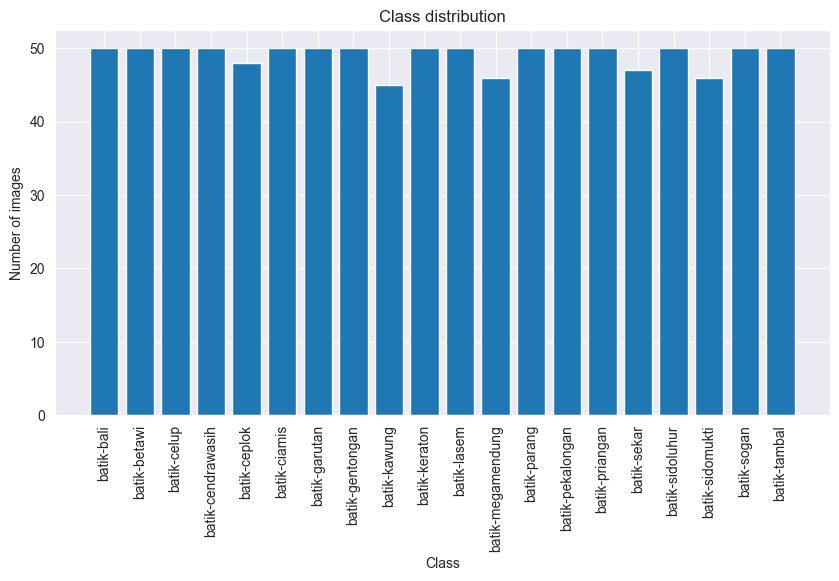

In [8]:
class_names = os.listdir(dataset_path)
class_counts = {class_name: len(os.listdir(os.path.join(dataset_path, class_name))) for class_name in class_names}

plt.figure(figsize=(10, 5))
plt.bar(class_counts.keys(), class_counts.values())
plt.xlabel('Class')
plt.ylabel('Number of images')
plt.title('Class distribution')
plt.xticks(rotation=90)
plt.show()


FILTER HANYA MENGAMBIL 3 CLASS

In [9]:
filtered_dir = '/kaggle/working/filtered_dataset'

In [10]:
def filter_classes(source_dir, filtered_dir, classes):
    if not os.path.exists(filtered_dir):
        os.makedirs(filtered_dir)

    for root, _, files in os.walk(source_dir):
        for file in files:
            file_path = os.path.join(root, file)
            class_name = os.path.basename(os.path.dirname(file_path))

            if class_name in classes:
                new_file_path = os.path.join(filtered_dir, class_name, file)

                if not os.path.exists(os.path.join(filtered_dir, class_name)):
                    os.makedirs(os.path.join(filtered_dir, class_name))

                shutil.copy(file_path, new_file_path)
                print(f"File '{file}' dari kelas '{class_name}' telah dipindahkan.")


classes_to_filter = ['batik-bali', 'batik-betawi', 'batik-sogan']

filter_classes(dataset_path, filtered_dir, classes_to_filter)


File '1.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '10.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '11.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '12.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '13.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '14.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '15.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '16.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '17.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '18.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '19.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '2.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '20.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '21.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '22.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '23.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '24.jpg' dari kelas 'batik-bali' telah dipindahkan.
File '25.jpg' dari kelas 'batik-b

LOAD FILTER

In [11]:
x_filtered, y_filtered = load_dataset(filtered_dir)

Error loading image /kaggle/working/filtered_dataset\batik-betawi\4.jpg: Not a valid image file


In [12]:
filtered_class_names = os.listdir(filtered_dir)

In [13]:
for i, class_name in enumerate(filtered_class_names):
    class_dir = os.path.join(filtered_dir, class_name)
    num_images = len(os.listdir(class_dir))
    print(f"Class '{class_name}': {num_images} images")


Class 'batik-bali': 50 images
Class 'batik-betawi': 50 images
Class 'batik-sogan': 50 images


In [14]:
print(os.listdir(filtered_dir))

['batik-bali', 'batik-betawi', 'batik-sogan']


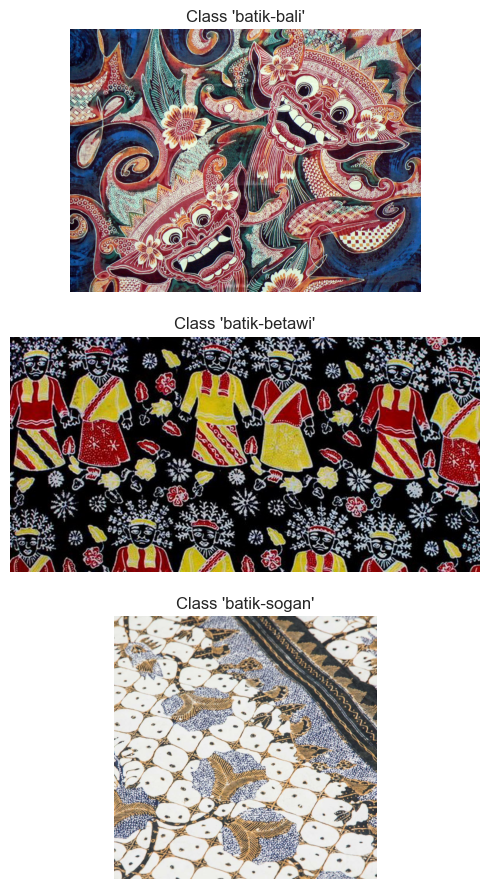

In [15]:
def display_one_image_per_class(base_dir, class_names):
    fig, axes = plt.subplots(len(class_names), 1, figsize=(5, len(class_names) * 3))
    
    for i, class_name in enumerate(class_names):
        class_dir = os.path.join(base_dir, class_name)
        image_filename = os.listdir(class_dir)[0]
        
        image_path = os.path.join(class_dir, image_filename)
        image = mpimg.imread(image_path)
        
        ax = axes[i]
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(f"Class '{class_name}'")
    
    plt.tight_layout()
    plt.show()

display_one_image_per_class(filtered_dir, filtered_class_names)


Noise

In [16]:
def check_noise(filtered_dir):
    for class_name in os.listdir(filtered_dir):
        class_dir = os.path.join(filtered_dir, class_name)
        for filename in os.listdir(class_dir):
            image_path = os.path.join(class_dir, filename)
            image = cv2.imread(image_path)
            
            if image is not None:
                std_dev = np.std(image)
                print(f"File: {filename}, Class: {class_name}, Noise Std Deviation: {std_dev}")

check_noise(filtered_dir)


File: 1.jpg, Class: batik-bali, Noise Std Deviation: 69.01487779605279
File: 10.jpg, Class: batik-bali, Noise Std Deviation: 74.57300119922371
File: 11.jpg, Class: batik-bali, Noise Std Deviation: 92.55132555817417
File: 12.jpg, Class: batik-bali, Noise Std Deviation: 62.314162010765884
File: 13.jpg, Class: batik-bali, Noise Std Deviation: 59.39250319853676
File: 14.jpg, Class: batik-bali, Noise Std Deviation: 67.97557693538143
File: 15.jpg, Class: batik-bali, Noise Std Deviation: 74.34685925339443
File: 16.jpg, Class: batik-bali, Noise Std Deviation: 76.93558042611784
File: 17.jpg, Class: batik-bali, Noise Std Deviation: 78.11776854243158
File: 18.jpg, Class: batik-bali, Noise Std Deviation: 45.806737964492
File: 19.jpg, Class: batik-bali, Noise Std Deviation: 68.38479052772792
File: 2.jpg, Class: batik-bali, Noise Std Deviation: 82.95920037555629
File: 20.jpg, Class: batik-bali, Noise Std Deviation: 88.42472758340774
File: 21.jpg, Class: batik-bali, Noise Std Deviation: 73.7123091451

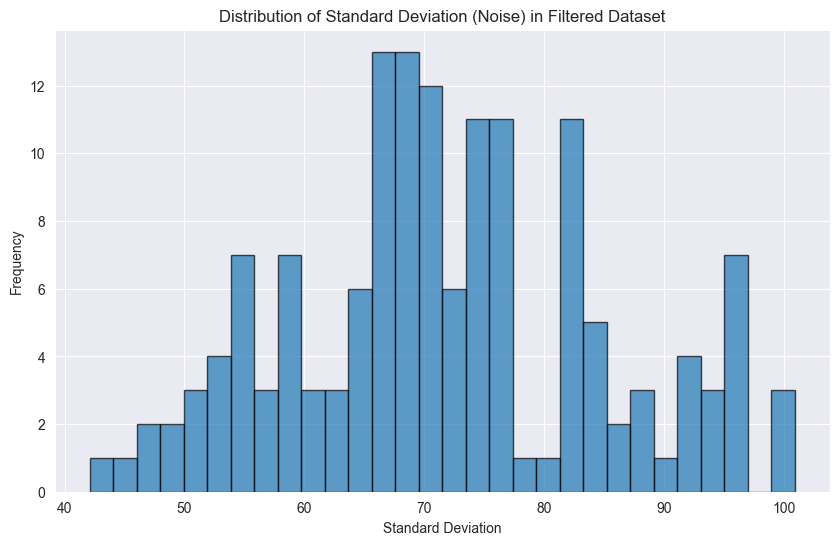

In [17]:
def plot_noise_histogram(filtered_dir):
    std_devs = []

    for class_name in os.listdir(filtered_dir):
        class_dir = os.path.join(filtered_dir, class_name)
        
        for filename in os.listdir(class_dir):
            image_path = os.path.join(class_dir, filename)
            image = cv2.imread(image_path)
            
            if image is not None:
                std_dev = np.std(image)
                std_devs.append(std_dev)
    
    plt.figure(figsize=(10, 6))
    plt.hist(std_devs, bins=30, edgecolor='black', alpha=0.7)
    plt.xlabel('Standard Deviation')
    plt.ylabel('Frequency')
    plt.title('Distribution of Standard Deviation (Noise) in Filtered Dataset')
    plt.grid(True)
    plt.show()
plot_noise_histogram(filtered_dir)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..65025.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..65025.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..65025.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..64770.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..65025.0].


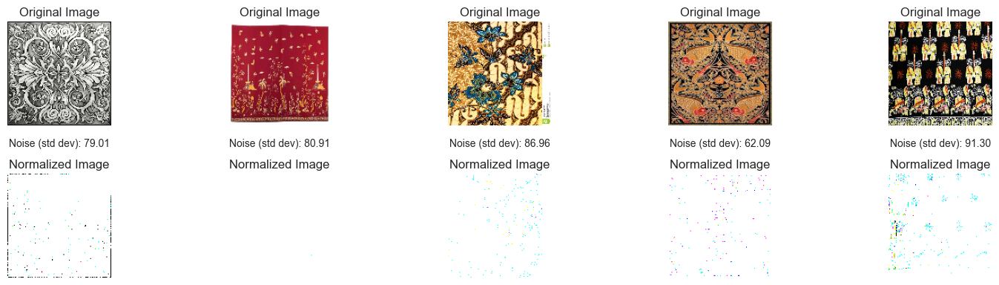

In [18]:
def plot_images_with_noise_check(images, num_examples=5):
    example_indices = np.random.randint(0, len(images), size=num_examples)
    
    plt.figure(figsize=(15, 6))
    
    for i, idx in enumerate(example_indices):
        original_img = cv2.cvtColor(images[idx], cv2.COLOR_BGR2RGB)
        plt.subplot(3, num_examples, i + 1)
        plt.imshow(original_img)
        plt.title('Original Image')
        plt.axis('off')

        std_dev = np.std(images[idx])
        noise_info = f"Noise (std dev): {std_dev:.2f}"
        plt.text(0.5, -0.2, noise_info, ha='center', transform=plt.gca().transAxes, fontsize=10)

        normalized_img = images[idx] * 255.0
        plt.subplot(3, num_examples, num_examples + i + 1)
        plt.imshow(normalized_img.squeeze(), cmap='gray')
        plt.title('Normalized Image')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

plot_images_with_noise_check(x_filtered)


> jika dilihat dari gambar, terlihat ada gambar yang memiliki noise.

> dari sumber yang dibaca, disebut noise gaussian karena berbentuk seperti titik-titik.

> selain itu terdapat juga noise speckle yang terlihat seperti bintik-bintik kecil yang berkumpul di area tertentu yang biasa disebabkan oleh pantulan cahaya

> noise akan terlihat jelas pada gambar batik yang berwarna terang, dan noise speckle terlihat pada beberapa gambar batik yang memiliki motif yang kompleks

> tingkat keparahan dari gambar yang diamati bervariasi beberapa yang terlihat sedikit dan tidak mengganggu kualitas gambar. Namun, pada beberapa gambar batik lainnya, noise terlihat cukup parah dan dapat mengganggu kualitas gambar

Brightness

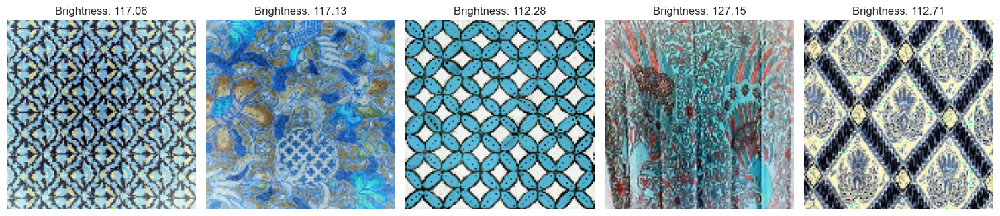

In [19]:
def plot_images_brightness(images, num_examples=5):
    example_indices = np.random.randint(0, len(images), size=num_examples)

    plt.figure(figsize=(15, 6))
    for i, idx in enumerate(example_indices):
        brightness = np.mean(images[idx])

        img = images[idx] * 255.0
        img_rgb = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_BGR2RGB)

        plt.subplot(1, num_examples, i + 1)
        plt.imshow(img_rgb)
        plt.title(f'Brightness: {brightness:.2f}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

plot_images_brightness(x_filtered)


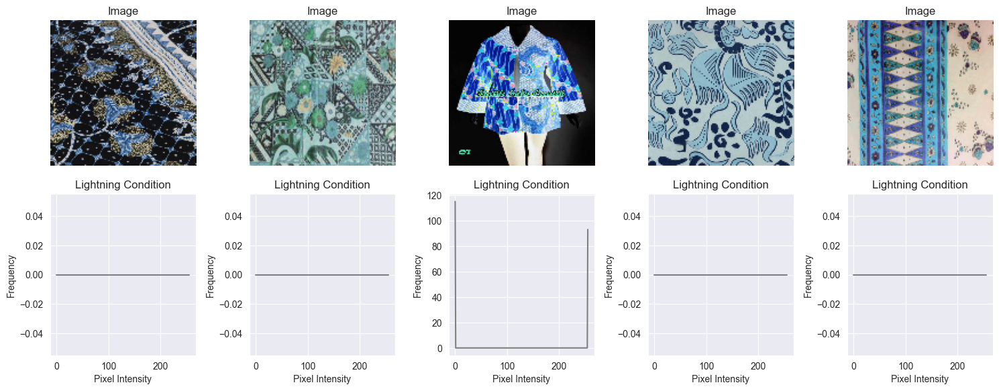

In [20]:
def plot_images_lightning(images, num_examples=5):
    example_indices = np.random.randint(0, len(images), size=num_examples)

    plt.figure(figsize=(15, 6))
    for i, idx in enumerate(example_indices):
        hist = np.histogram(images[idx].ravel(), bins=256, range=(0.0, 1.0))[0]  # Normalized histogram

        img = images[idx] * 255.0  
        img_rgb = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_BGR2RGB)

        plt.subplot(2, num_examples, i + 1)
        plt.imshow(img_rgb)
        plt.title('Image')
        plt.axis('off')

        plt.subplot(2, num_examples, num_examples + i + 1)
        plt.plot(hist, color='gray')
        plt.title('Lightning Condition')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

plot_images_lightning(x_filtered)


Type Data Check

In [21]:
subdirectories = [name for name in os.listdir(filtered_dir) if os.path.isdir(os.path.join(filtered_dir, name))]

for subdir in subdirectories:
    subdir_path = os.path.join(filtered_dir, subdir)
    print(f"Isi dari direktori '{subdir}':")
    
    all_jpg = True
    all_images = True
    
    for entry in os.listdir(subdir_path):
        entry_path = os.path.join(subdir_path, entry)
        if os.path.isfile(entry_path):
            if entry.lower().endswith(('.jpg', '.jpeg', '.png', '.gif')):
                if not entry.lower().endswith('.jpg'):
                    all_jpg = False

            else:
                all_images = False
                print(f"  File: {entry} (bukan format gambar)")
    
    if all_jpg:
        print("Semua file adalah format JPG.")
    elif all_images:
        print("Semua file adalah format gambar, tetapi tidak semuanya JPG.")
    else:
        print("Terdapat file dengan format selain JPG dalam direktori ini.")
    
    print()

Isi dari direktori 'batik-bali':
Semua file adalah format JPG.

Isi dari direktori 'batik-betawi':
Semua file adalah format JPG.

Isi dari direktori 'batik-sogan':
Semua file adalah format JPG.



Broken File

In [22]:
def verify_images(directory):
    bad_files_found = False

    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            try:
                img = Image.open(file_path)
                img.verify()
            except (IOError, SyntaxError) as e:
                print(f"Bad file: {file_path}")
                bad_files_found = True  
            except Exception as e:
                print(f"Error processing file: {file_path} - {str(e)}")
                bad_files_found = True  

    if not bad_files_found:
        print("Semua file dalam direktori valid.")

verify_images(filtered_dir)


Semua file dalam direktori valid.


Duplicate Check

Duplicate found: /kaggle/working/filtered_dataset\batik-betawi\33.jpg is a duplicate of /kaggle/working/filtered_dataset\batik-bali\13.jpg


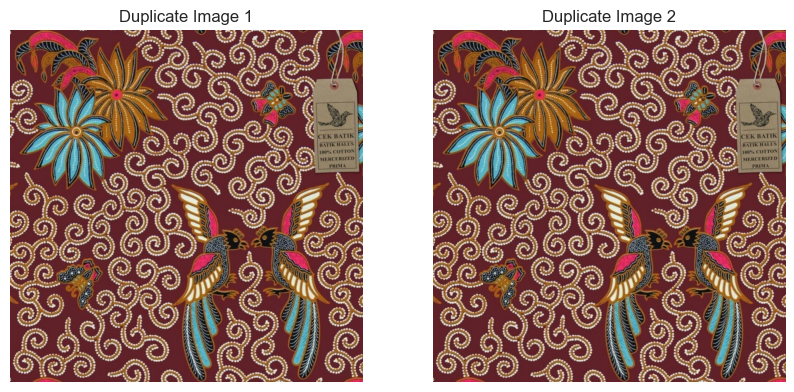

Duplicate found: /kaggle/working/filtered_dataset\batik-sogan\18.jpg is a duplicate of /kaggle/working/filtered_dataset\batik-bali\21.jpg


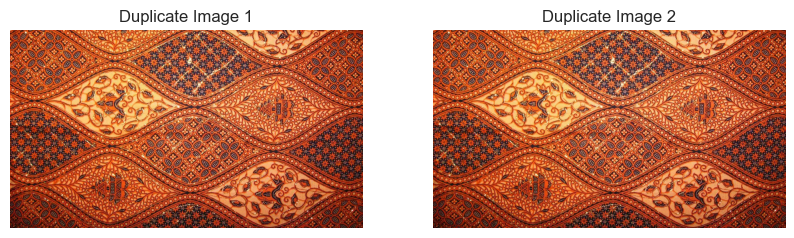

In [23]:
def find_duplicate_images(directory):
    hash_dict = {}
    duplicates_found = False

    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)

            try:
                with open(file_path, 'rb') as f:
                    file_hash = hashlib.md5(f.read()).hexdigest()

                if file_hash in hash_dict:
                    print(f"Duplicate found: {file_path} is a duplicate of {hash_dict[file_hash]}")

                    show_image_comparison(file_path, hash_dict[file_hash])
                    
                    duplicates_found = True
                else:
                    hash_dict[file_hash] = file_path

            except Exception as e:
                print(f"Error processing file: {file_path} - {str(e)}")
    
    if not duplicates_found:
        print("No duplicate images found.")


def show_image_comparison(file_path1, file_path2):
    img1 = Image.open(file_path1)
    img2 = Image.open(file_path2)

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(img1)
    ax[0].set_title('Duplicate Image 1')
    ax[0].axis('off')
    ax[1].imshow(img2)
    ax[1].set_title('Duplicate Image 2')
    ax[1].axis('off')
    plt.show()

find_duplicate_images(filtered_dir)


PRE PROCESSING DATA

In [24]:
os.remove('/kaggle/working/filtered_dataset/batik-betawi/33.jpg')
os.remove('/kaggle/working/filtered_dataset/batik-bali/13.jpg')
os.remove('/kaggle/working/filtered_dataset/batik-sogan/18.jpg')
os.remove('/kaggle/working/filtered_dataset/batik-bali/21.jpg')

In [25]:
find_duplicate_images(filtered_dir)

No duplicate images found.


In [26]:
for i, class_name in enumerate(filtered_class_names):
    class_dir = os.path.join(filtered_dir, class_name)
    num_images = len(os.listdir(class_dir))
    print(f"Class '{class_name}': {num_images} images")

Class 'batik-bali': 48 images
Class 'batik-betawi': 49 images
Class 'batik-sogan': 49 images


In [27]:
original_dataset_dir = filtered_dir

base_dir = '/kaggle/working/'
train_dir = os.path.join(base_dir, 'train')
valid_dir = os.path.join(base_dir, 'valid')
test_dir = os.path.join(base_dir, 'test')

os.makedirs(train_dir, exist_ok=True)
os.makedirs(valid_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

class_names = ['batik-bali', 'batik-betawi', 'batik-sogan']
for class_name in class_names:
    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(valid_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)

# Fungsi untuk membagi dataset
def split_dataset(original_dir, train_dir, valid_dir, test_dir, class_name, train_size, valid_size, test_size):
    class_dir = os.path.join(original_dir, class_name)
    images = os.listdir(class_dir)

    train_images, temp_images = train_test_split(images, train_size=train_size/(train_size + valid_size + test_size), random_state=42)
    valid_images, test_images = train_test_split(temp_images, test_size=test_size/(valid_size + test_size), random_state=42)

    for image in train_images:
        src = os.path.join(class_dir, image)
        dst = os.path.join(train_dir, class_name, image)
        shutil.copyfile(src, dst)

    for image in valid_images:
        src = os.path.join(class_dir, image)
        dst = os.path.join(valid_dir, class_name, image)
        shutil.copyfile(src, dst)

    for image in test_images:
        src = os.path.join(class_dir, image)
        dst = os.path.join(test_dir, class_name, image)
        shutil.copyfile(src, dst)

total_per_class = 48

train_size = 32
valid_size = 8
test_size = 8

train_prop = train_size / total_per_class
valid_prop = valid_size / total_per_class
test_prop = test_size / total_per_class

for class_name in class_names:
    split_dataset(original_dataset_dir, train_dir, valid_dir, test_dir, class_name, train_prop, valid_prop, test_prop)

print("Pembagian dataset selesai.")

Pembagian dataset selesai.


In [28]:
def count_images_in_directory(directory):
    class_counts = {}
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            class_counts[class_name] = len(os.listdir(class_dir))
    return class_counts

# Menghitung jumlah gambar per kelas di setiap set
train_class_counts = count_images_in_directory(train_dir)
valid_class_counts = count_images_in_directory(valid_dir)
test_class_counts = count_images_in_directory(test_dir)

print("Training class counts:", train_class_counts)
print("Validation class counts:", valid_class_counts)
print("Testing class counts:", test_class_counts)

Training class counts: {'batik-bali': 32, 'batik-betawi': 32, 'batik-sogan': 32}
Validation class counts: {'batik-bali': 8, 'batik-betawi': 8, 'batik-sogan': 8}
Testing class counts: {'batik-bali': 8, 'batik-betawi': 9, 'batik-sogan': 9}


MODEL 1 (from scratch without augmentation)

In [29]:
img_shape = (128, 128, 3)
img_size = (128, 128)
batch_size = 32


#data augmentation
train_aug = ImageDataGenerator(
#     rotation_range = 40,
#     width_shift_range = 0.2,
#     height_shift_range = 0.2,
#     zoom_range = 0.5,
#     horizontal_flip = True,
#     shear_range = 0.2,
#     fill_mode = 'nearest', #pixel yg hilang diisi dengan nilai pixel terdekat
    rescale=1./255
)

test_aug = ImageDataGenerator(
    rescale=1./255
)

valid_aug = ImageDataGenerator(
    rescale=1./255
)

new_train = train_aug.flow_from_directory(train_dir, 
#                                           x_col = 'files', 
#                                           y_col = 'labels',
                                         target_size = img_size,
                                         class_mode = 'categorical',
                                         color_mode = 'rgb',
                                         shuffle = True,
                                         batch_size = batch_size)

new_test = test_aug.flow_from_directory(test_dir, 
#                                           x_col = 'files', 
#                                           y_col = 'labels',
                                         target_size = img_size,
                                         class_mode = 'categorical',
                                         color_mode = 'rgb',
                                         shuffle = True,
                                         batch_size = batch_size)

new_valid = valid_aug.flow_from_directory(valid_dir, 
#                                           x_col = 'files', 
#                                           y_col = 'labels',
                                         target_size = img_size,
                                         class_mode = 'categorical',
                                         color_mode = 'rgb',
                                         shuffle = True,
                                         batch_size = batch_size)
classs = list(new_train.class_indices.keys())
print(classs)

Found 96 images belonging to 3 classes.
Found 26 images belonging to 3 classes.
Found 24 images belonging to 3 classes.
['batik-bali', 'batik-betawi', 'batik-sogan']


In [30]:
def show_image_samples(gen):
    test_dict=new_test.class_indices
    classes=list(test_dict.keys())    
    images,labels=next(gen)
    plt.figure(figsize=(20, 20))
    length=len(labels)
    if length<25:   #max 25 foto
        r=length
    else:
        r=25
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image=images[i]
        plt.imshow(image)
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name, color='blue', fontsize=16)
        plt.axis('off')
    plt.show()

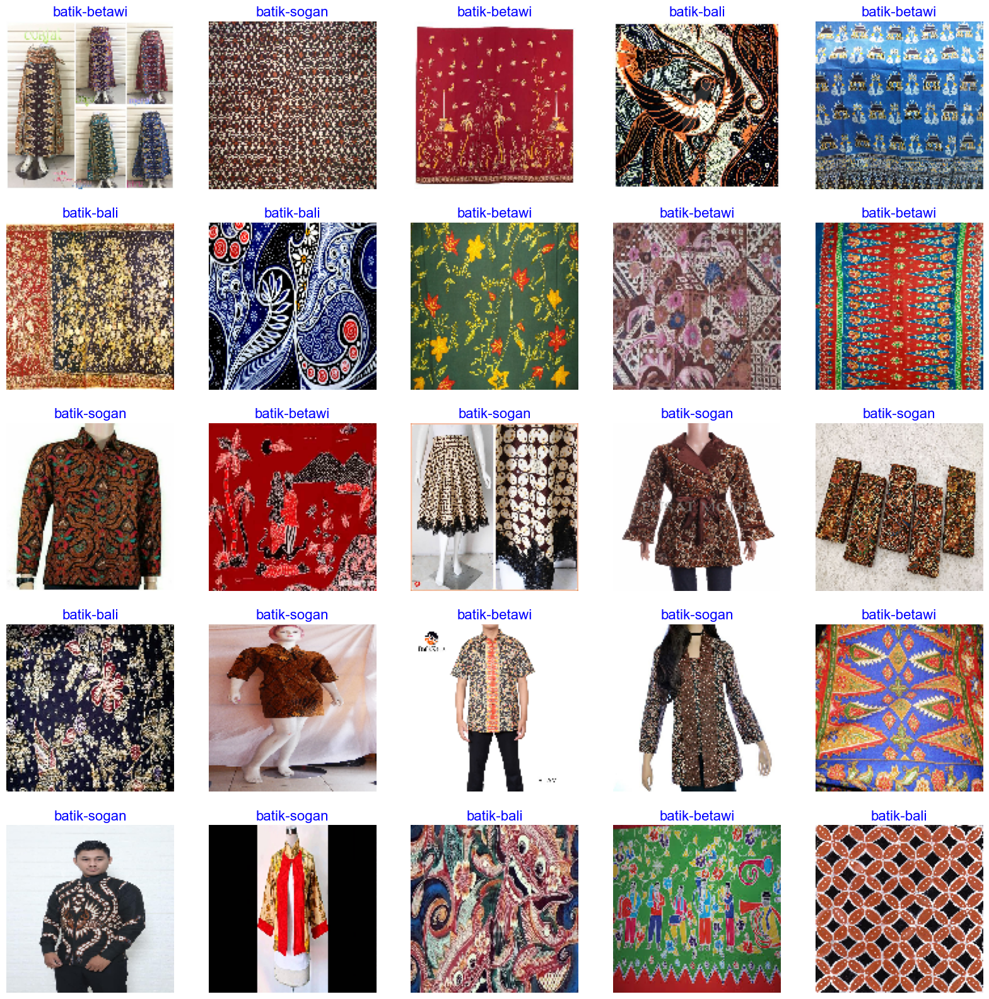

In [31]:
show_image_samples(new_train)

In [32]:
model = models.Sequential()

model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=img_shape))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(3, activation='softmax'))

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])


c:\Users\Windows\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [33]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 12, 12, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 9216)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     4,719,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,109,059 (19.49 MB)

 Trainable params: 5,109,059 (19.49 MB)

 Non-trainable params: 0 (0.00 B)

In [34]:
epoch = 100
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
predict = model.fit(new_train,
                    epochs = epoch,
                    validation_data = new_valid,
                    callbacks = [early_stopping]
                   )

Epoch 1/100


c:\Users\Windows\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 562ms/step - accuracy: 0.3789 - loss: 1.6642 - val_accuracy: 0.3333 - val_loss: 1.1040
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 298ms/step - accuracy: 0.3346 - loss: 1.1058 - val_accuracy: 0.3333 - val_loss: 1.0944
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 297ms/step - accuracy: 0.3424 - loss: 1.0971 - val_accuracy: 0.5000 - val_loss: 1.0876
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 288ms/step - accuracy: 0.5286 - loss: 1.0834 - val_accuracy: 0.4583 - val_loss: 1.0733
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 289ms/step - accuracy: 0.5013 - loss: 1.0607 - val_accuracy: 0.6250 - val_loss: 1.0406
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 287ms/step - accuracy: 0.5703 - loss: 1.0181 - val_accuracy: 0.2917 - val_loss: 1.0979
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 295ms/step - accuracy: 0.5065 - loss: 0.9660 - val_accuracy: 0.6667 - val_loss: 0.9118
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step - accuracy: 0.5286 - loss: 0.9363 - val_accuracy: 0.6250 - val_loss: 0.8

In [35]:
prediction = model.predict(new_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


In [36]:
test_loss, test_accuracy = model.evaluate(new_test)
print(f"Test Accuracy: {test_accuracy}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.6923 - loss: 0.7070
Test Accuracy: 0.692307710647583


In [37]:
y_true = new_test.classes
y_pred = np.argmax(prediction, axis=-1)
target_names = list(new_test.class_indices.keys())
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

  batik-bali       0.09      0.12      0.11         8
batik-betawi       0.00      0.00      0.00         9
 batik-sogan       0.00      0.00      0.00         9

    accuracy                           0.04        26
   macro avg       0.03      0.04      0.04        26
weighted avg       0.03      0.04      0.03        26



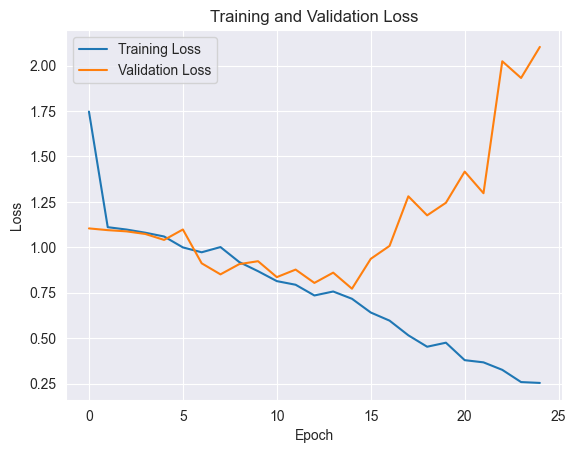

In [38]:
plt.plot(predict.history['loss'], label='Training Loss')
plt.plot(predict.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

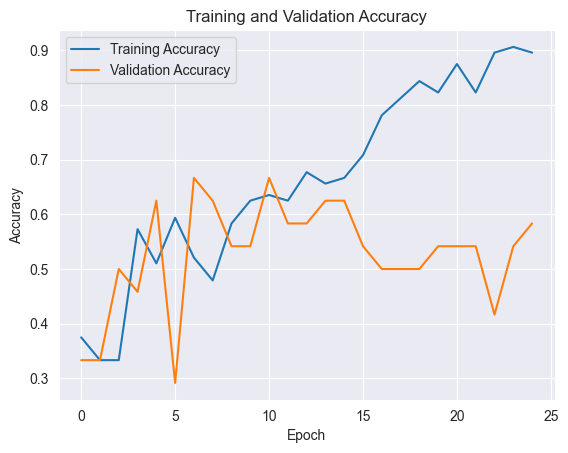

In [39]:
plt.plot(predict.history['accuracy'], label='Training Accuracy')
plt.plot(predict.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

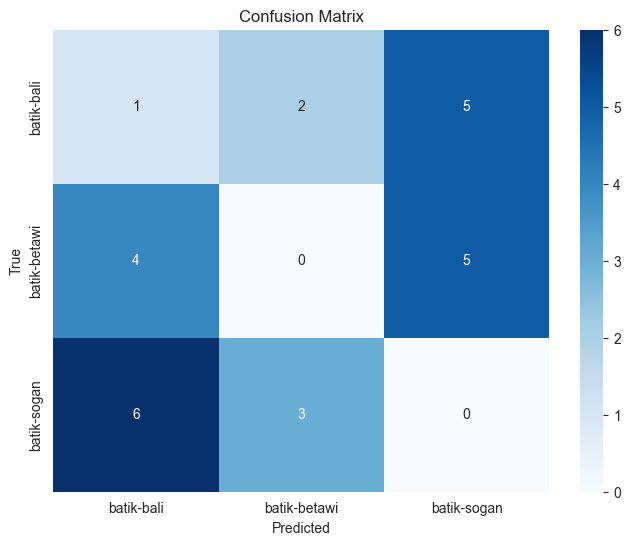

In [40]:
# Membuat confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Visualisasi confusion matrix menggunakan heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

model masih belum bisa memprediksi jenis batik dengan akurat

MODEL 2 (MobileNetV2 with Dropout + Batch Normalization + Regularization)

In [41]:
img_shape = (128, 128, 3)
img_size = (128, 128)
batch_size = 32


#data augmentation
train_aug = ImageDataGenerator(
#     rotation_range = 40,
#     width_shift_range = 0.2,
#     height_shift_range = 0.2,
#     zoom_range = 0.5,
#     horizontal_flip = True,
#     shear_range = 0.2,
#     fill_mode = 'nearest', #pixel yg hilang diisi dengan nilai pixel terdekat
    rescale=1./255
)

test_aug = ImageDataGenerator(
    rescale=1./255
)

valid_aug = ImageDataGenerator(
    rescale=1./255
)

new_train = train_aug.flow_from_directory(train_dir, 
#                                           x_col = 'files', 
#                                           y_col = 'labels',
                                         target_size = img_size,
                                         class_mode = 'categorical',
                                         color_mode = 'rgb',
                                         shuffle = True,
                                         batch_size = batch_size)

new_test = test_aug.flow_from_directory(test_dir, 
#                                           x_col = 'files', 
#                                           y_col = 'labels',
                                         target_size = img_size,
                                         class_mode = 'categorical',
                                         color_mode = 'rgb',
                                         shuffle = True,
                                         batch_size = batch_size)

new_valid = valid_aug.flow_from_directory(valid_dir, 
#                                           x_col = 'files', 
#                                           y_col = 'labels',
                                         target_size = img_size,
                                         class_mode = 'categorical',
                                         color_mode = 'rgb',
                                         shuffle = True,
                                         batch_size = batch_size)
classs = list(new_train.class_indices.keys())
print(classs)

Found 96 images belonging to 3 classes.
Found 26 images belonging to 3 classes.
Found 24 images belonging to 3 classes.
['batik-bali', 'batik-betawi', 'batik-sogan']


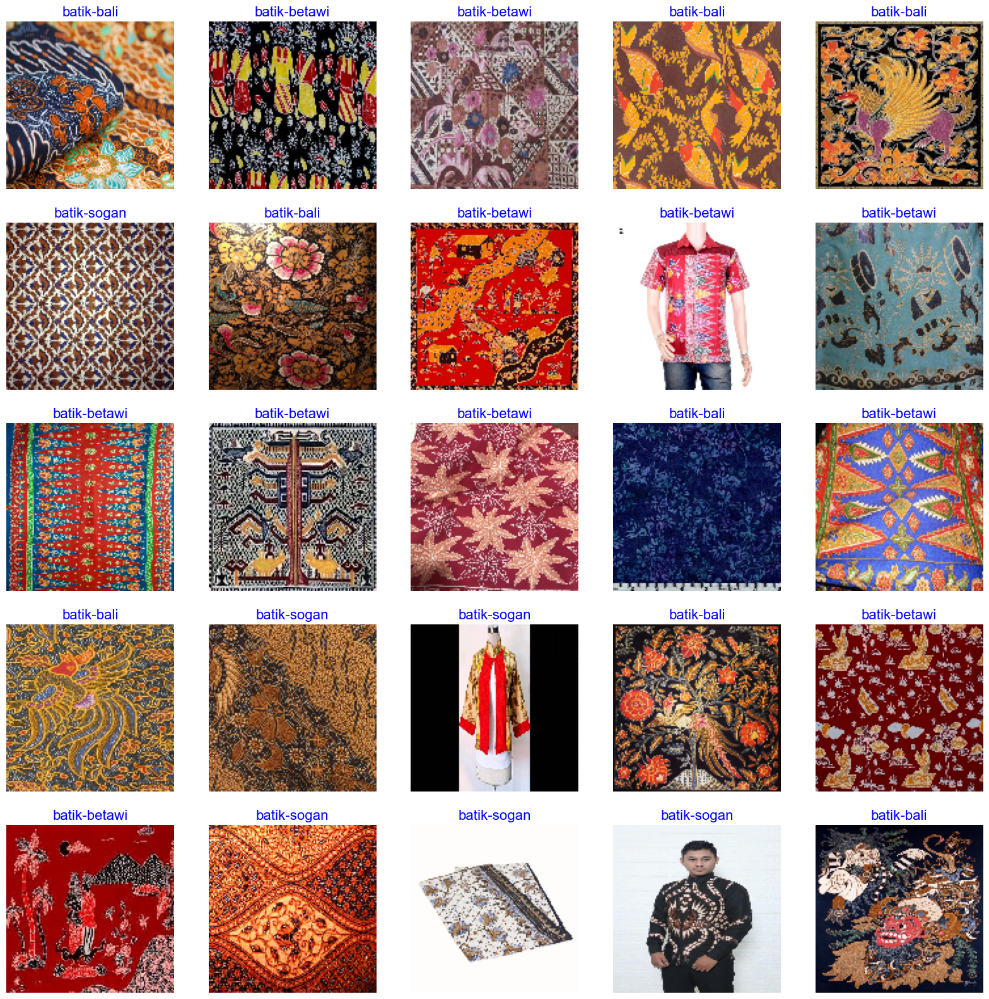

In [42]:
show_image_samples(new_train)

In [44]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

base_model.trainable = False

l2_reg = l2(0.01)

transfer_model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu', kernel_regularizer=l2_reg),
    BatchNormalization(),
    Dropout(0.5),
    Dense(3, activation='softmax')
])
transfer_model.compile(optimizer=Adam(learning_rate=1e-3), loss='categorical_crossentropy', metrics=['accuracy'])


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


NameError: name 'l2' is not defined

In [42]:
transfer_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128            │ ?                      │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [43]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
mobilenet_train = transfer_model.fit(
    new_train,
    epochs=100,
    validation_data=new_valid,
    callbacks = [early_stopping]
)

Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/3 ━━━━━━━━━━━━━━━━━━━━ 31s 16s/step - accuracy: 0.2812 - loss: 1.7127

I0000 00:00:1718997913.073917    4157 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1718997913.110022    4157 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1718997919.973520    4160 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 4s/step - accuracy: 0.3685 - loss: 1.7072 - val_accuracy: 0.4583 - val_loss: 1.0669
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 183ms/step - accuracy: 0.8646 - loss: 0.2809 - val_accuracy: 0.6667 - val_loss: 1.1772
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 181ms/step - accuracy: 0.9818 - loss: 0.0900 - val_accuracy: 0.7083 - val_loss: 1.3370
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 181ms/step - accuracy: 0.9909 - loss: 0.0236 - val_accuracy: 0.7083 - val_loss: 1.4670
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 171ms/step - accuracy: 1.0000 - loss: 0.0085 - val_accuracy: 0.6667 - val_loss: 1.5744
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 180ms/step - accuracy: 1.0000 - loss: 0.0083 - val_accuracy: 0.6667 - val_loss: 1.6491
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 170ms/step - accuracy: 1.0000 - loss: 0.0113 - val_accuracy: 0.6667 - val_loss: 1.6953
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - accuracy: 1.0000 - loss: 0.0105 - val_accuracy: 0.6667 - val_loss: 1.714

In [44]:
transfer_predict = transfer_model.predict(new_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


W0000 00:00:1718997946.436519    4157 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [45]:
trans_y_true = new_test.classes
trans_y_pred = np.argmax(transfer_predict, axis=-1)
trans_target_names = list(new_test.class_indices.keys())
print(classification_report(trans_y_true, trans_y_pred, target_names=trans_target_names))

              precision    recall  f1-score   support

  batik-bali       0.43      0.38      0.40         8
batik-betawi       0.38      0.67      0.48         9
 batik-sogan       0.00      0.00      0.00         9

    accuracy                           0.35        26
   macro avg       0.27      0.35      0.29        26
weighted avg       0.26      0.35      0.29        26



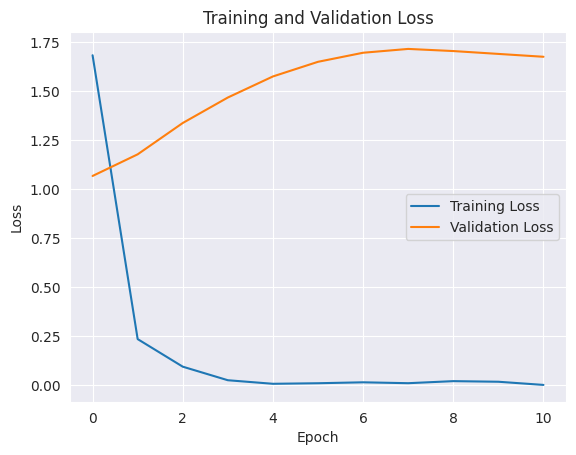

In [46]:
plt.plot(mobilenet_train.history['loss'], label='Training Loss')
plt.plot(mobilenet_train.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

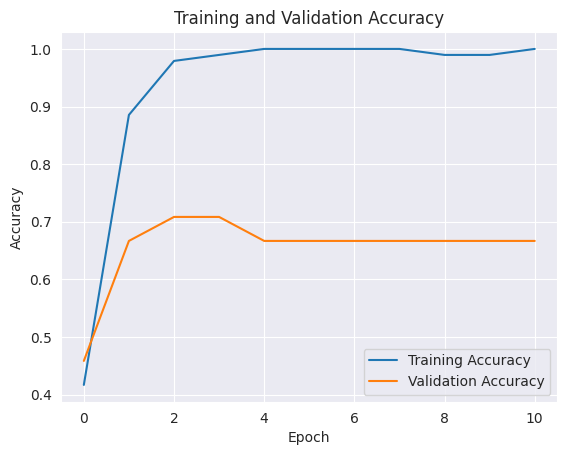

In [47]:
plt.plot(mobilenet_train.history['accuracy'], label='Training Accuracy')
plt.plot(mobilenet_train.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

MODEL 3 (EfficientNetB2 with Augmentation and less batch size, Dropout, Batch Normalization,Regularization, LR Reduce)

In [ ]:
from keras.applications import EfficientNetB2
from keras.models import Sequential
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
import numpy as np
from sklearn.metrics import classification_report

In [ ]:
#augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    width_shift_range=0.2,
    height_shift_range=0.2,
#     shear_range=0.2,
    zoom_range=0.5
#     fill_mode='nearest'
)
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    batch_size=5,
    class_mode='categorical'
)

valid_generator = valid_datagen.flow_from_directory(
    valid_dir,
    target_size=(128, 128),
    batch_size=5,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    batch_size=5,
    class_mode='categorical',
    shuffle=False
)


In [ ]:
show_image_samples(train_generator)

In [ ]:
base_model = EfficientNetB2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

for layer in base_model.layers[-20:]:
    layer.trainable = True

l2_reg = l2(0.01)

transfer_model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dropout(0.5),
    Dense(512, activation='relu', kernel_regularizer=l2_reg),
    BatchNormalization(),
    Dropout(0.5),
    Dense(3, activation='softmax')
])

transfer_model.compile(optimizer=Adam(learning_rate=1e-3), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-3)

efficient_net = transfer_model.fit(
    train_generator,
    epochs=100,
    validation_data=valid_generator,
    callbacks=[early_stopping, reduce_lr]
)

In [ ]:
print(f"Train Accuracy: {efficient_net.history['accuracy'][-1]}")
print(f"Validation Accuracy: {efficient_net.history['val_accuracy'][-1]}")

In [ ]:
test_loss, test_accuracy = transfer_model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy}")

In [ ]:
transfer_predict = transfer_model.predict(test_generator)


In [ ]:

trans_y_true = test_generator.classes
trans_y_pred = np.argmax(transfer_predict, axis=-1)
trans_target_names = list(test_generator.class_indices.keys())
print(classification_report(trans_y_true, trans_y_pred, target_names=trans_target_names))

In [ ]:
plt.plot(efficient_net.history['loss'], label='Training Loss')
plt.plot(efficient_net.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()